In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv(r'D:\Data Science\Capstone Project\Capstone Project 3\bike_sharing\data\raw\data_bike_sharing.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12165 entries, 0 to 12164
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   dteday      12165 non-null  object 
 1   hum         12165 non-null  float64
 2   weathersit  12165 non-null  int64  
 3   holiday     12165 non-null  int64  
 4   season      12165 non-null  int64  
 5   atemp       12165 non-null  float64
 6   temp        12165 non-null  float64
 7   hr          12165 non-null  int64  
 8   casual      12165 non-null  int64  
 9   registered  12165 non-null  int64  
 10  cnt         12165 non-null  int64  
dtypes: float64(3), int64(7), object(1)
memory usage: 1.0+ MB


# Data Preprocessing

In [4]:
df['dteday'] = pd.to_datetime(df['dteday'])

In [5]:
df = df.rename(columns={'dteday': 'date','weathersit': 'weather','atemp':'feeling_temp', 'hum': 'humidity','hr':'hour', 'cnt': 'count'})

In [6]:
df.head()

,date,humidity,weather,holiday,season,feeling_temp,temp,hour,casual,registered,count
0,2011-12-09,0.62,1,0,4,0.3485,0.36,16,24,226,250
1,2012-06-17,0.64,1,0,2,0.5152,0.54,4,2,16,18
2,2011-06-15,0.53,1,0,2,0.6212,0.62,23,17,90,107
3,2012-03-31,0.87,2,0,2,0.3485,0.36,8,19,126,145
4,2012-07-31,0.55,1,0,3,0.6970,0.76,18,99,758,857


In [7]:
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day_of_week

df = df.drop(['date','casual','registered'], axis=1)

In [8]:
print('Total number of duplicated rows:', df.duplicated().sum())

Total number of duplicated rows: 1


In [9]:
df = df.drop_duplicates()

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

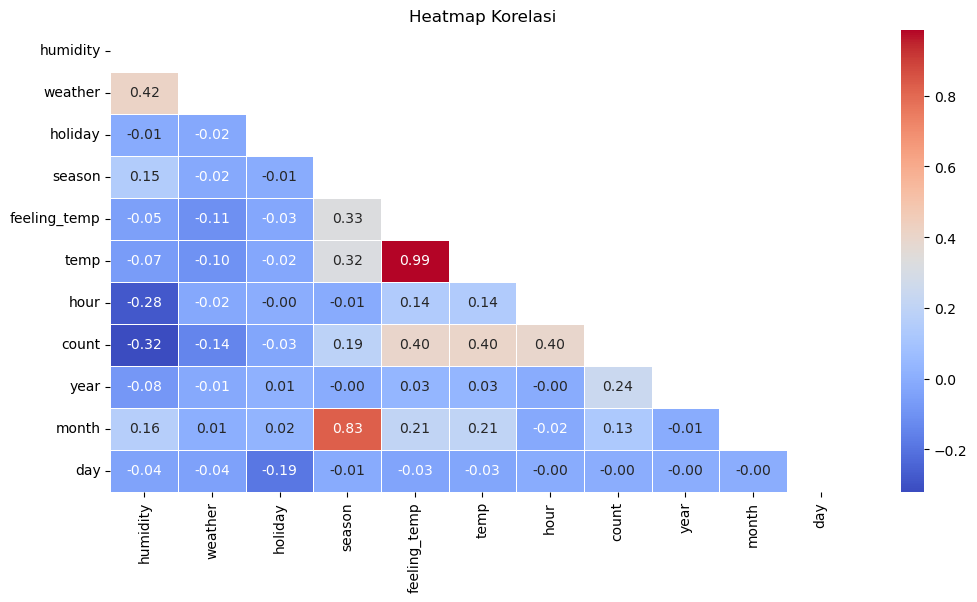

In [11]:
# Hitung korelasi
correlation_matrix = df.corr()
up_triangle = np.triu(df.corr())

# Plot heatmap korelasi
plt.figure(figsize=(12, 6))
sns.heatmap(correlation_matrix, annot=True,mask=up_triangle, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12164 entries, 0 to 12164
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   humidity      12164 non-null  float64
 1   weather       12164 non-null  int64  
 2   holiday       12164 non-null  int64  
 3   season        12164 non-null  int64  
 4   feeling_temp  12164 non-null  float64
 5   temp          12164 non-null  float64
 6   hour          12164 non-null  int64  
 7   count         12164 non-null  int64  
 8   year          12164 non-null  int32  
 9   month         12164 non-null  int32  
 10  day           12164 non-null  int32  
dtypes: float64(3), int32(3), int64(5)
memory usage: 997.8 KB


In [13]:
numerical_features = df[['temp', 'feeling_temp', 'humidity', 'count']]
category_features = df[['season', 'year', 'month', 'hour', 'holiday','weather', 'day']]

## Numerical Features

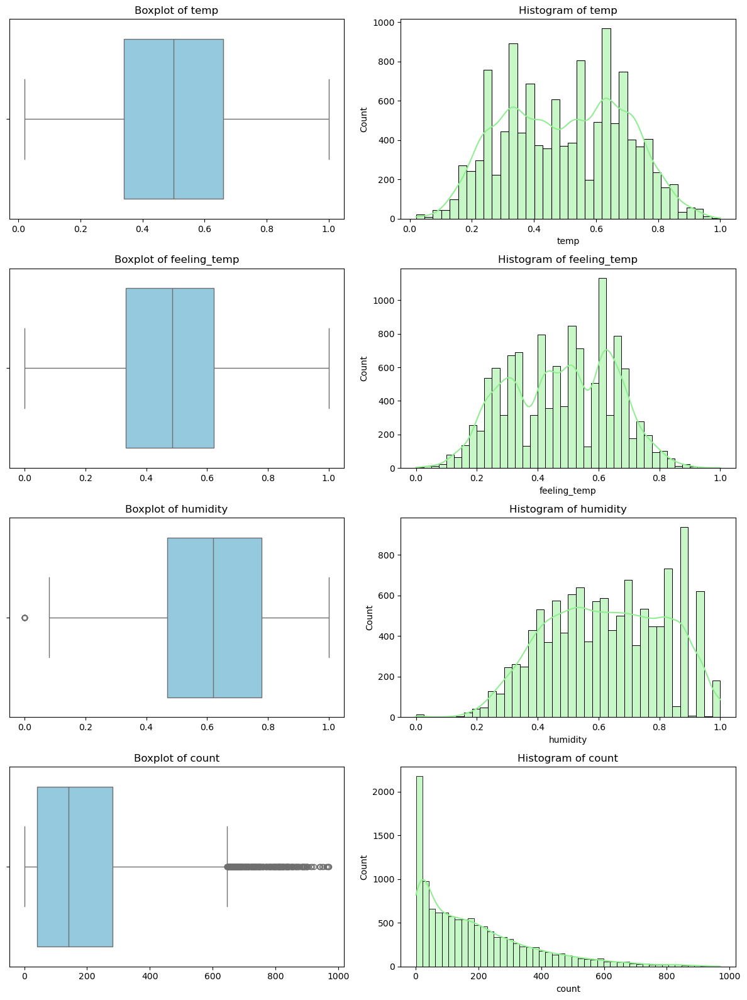

In [14]:
# Menampilkan boxplot dan histogram untuk semua kolom numerik dalam satu figure menggunakan subplot

# Membuat subplots
fig, axes = plt.subplots(4, 2, figsize=(12, 16))  # 4 baris, 2 kolom

# Looping melalui setiap kolom numerik
for i, col in enumerate(numerical_features.columns):
    row = i
    # Plot boxplot pada subplot kolom pertama
    sns.boxplot(x=numerical_features[col], ax=axes[row, 0], color='skyblue')
    axes[row, 0].set_title(f'Boxplot of {col}')
    axes[row, 0].set_xlabel('')

    # Plot histogram pada subplot kolom kedua
    sns.histplot(numerical_features[col], kde=True, ax=axes[row, 1], color='lightgreen')
    axes[row, 1].set_title(f'Histogram of {col}')
    axes[row, 1].set_xlabel(col)

# Menyesuaikan layout agar tidak saling tumpang tindih
plt.tight_layout()
plt.show()

In [15]:
df.describe()

,humidity,weather,holiday,season,feeling_temp,temp,hour,count,year,month,day
count,12164.000000,12164.000000,12164.000000,12164.000000,12164.000000,12164.000000,12164.000000,12164.000000,12164.000000,12164.000000,12164.000000
mean,0.625449,1.416968,0.029760,2.488491,0.477014,0.498206,11.520224,189.285679,2011.501973,6.510523,3.005097
std,0.192110,0.635952,0.169931,1.106118,0.171853,0.192485,6.931976,181.224143,0.500017,3.433775,1.992993
min,0.000000,1.000000,0.000000,1.000000,0.000000,0.020000,0.000000,1.000000,2011.000000,1.000000,0.000000
25%,0.470000,1.000000,0.000000,2.000000,0.333300,0.340000,6.000000,40.000000,2011.000000,4.000000,1.000000
50%,0.620000,1.000000,0.000000,2.000000,0.484800,0.500000,12.000000,142.000000,2012.000000,7.000000,3.000000
75%,0.780000,2.000000,0.000000,3.000000,0.621200,0.660000,18.000000,282.000000,2012.000000,9.000000,5.000000
max,1.000000,4.000000,1.000000,4.000000,1.000000,1.000000,23.000000,970.000000,2012.000000,12.000000,6.000000


In [16]:
df = df[df['humidity'] != 0]

In [17]:
df.describe()

,humidity,weather,holiday,season,feeling_temp,temp,hour,count,year,month,day
count,12150.000000,12150.000000,12150.000000,12150.000000,12150.000000,12150.000000,12150.000000,12150.000000,12150.000000,12150.000000,12150.000000
mean,0.626170,1.415309,0.029794,2.490206,0.477119,0.498334,11.520329,189.472016,2011.502551,6.514568,3.005103
std,0.191043,0.634324,0.170026,1.105600,0.171917,0.192555,6.932292,181.243125,0.500014,3.433683,1.994141
min,0.080000,1.000000,0.000000,1.000000,0.000000,0.020000,0.000000,1.000000,2011.000000,1.000000,0.000000
25%,0.480000,1.000000,0.000000,2.000000,0.333300,0.340000,6.000000,40.000000,2011.000000,4.000000,1.000000
50%,0.620000,1.000000,0.000000,2.000000,0.484800,0.500000,12.000000,142.000000,2012.000000,7.000000,3.000000
75%,0.780000,2.000000,0.000000,3.000000,0.621200,0.660000,18.000000,282.000000,2012.000000,9.000000,5.000000
max,1.000000,4.000000,1.000000,4.000000,1.000000,1.000000,23.000000,970.000000,2012.000000,12.000000,6.000000


In [18]:
from scipy.stats import shapiro, normaltest

# Fungsi untuk pengujian normalitas
def test_normality(data):
    results = {}
    for column in data.columns:
        # Shapiro-Wilk Test
        stat, p_value = shapiro(data[column])
        results[column] = {
            'Shapiro-Wilk p-value': p_value,
            'Normal (Shapiro)': p_value > 0.05,  # True jika p-value > 0.05
        }
        
        # D'Agostino and Pearson's Normal Test
        stat, p_value = normaltest(data[column])
        results[column].update({
            'D\'Agostino p-value': p_value,
            'Normal (D\'Agostino)': p_value > 0.05,
        })
    
    return pd.DataFrame(results).T

# Pengujian normalitas
normality_results = test_normality(numerical_features)
normality_results


,Shapiro-Wilk p-value,Normal (Shapiro),D'Agostino p-value,Normal (D'Agostino)
temp,0.0,False,0.0,False
feeling_temp,0.0,False,0.0,False
humidity,0.0,False,0.0,False
count,0.0,False,0.0,False


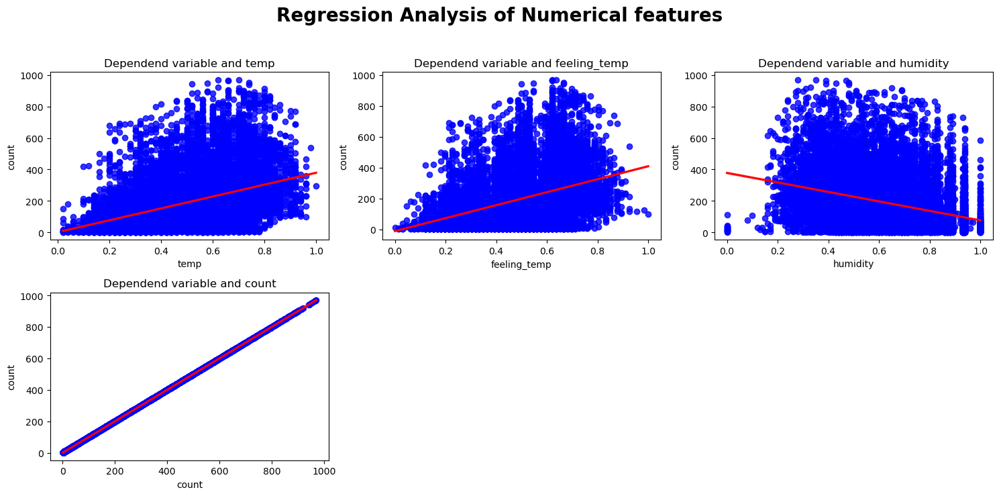

In [19]:
# Checking Linearity of all numerical features with our target variable

# figsize
plt.figure(figsize=(15, 10))

# title
plt.suptitle('Regression Analysis of Numerical features', fontsize=20, fontweight='bold', y=1.02)

for i, col in enumerate(numerical_features):

  # subplots of 3 rows and 3 columns
  plt.subplot(3, 3, i+1)

  # regression plots
  sns.regplot(x= numerical_features[col], y = numerical_features['count'], scatter_kws={"color": "blue"}, line_kws={"color": "red"})

  plt.title(f'Dependend variable and {col}')
  plt.tight_layout()

## Category Features

In [20]:
def check_categorical_imbalance(data):
    results = {}
    for column in data.columns:
        # Hitung distribusi frekuensi kategori
        freq = data[column].value_counts(normalize=True) * 100  # Dalam persentase
        results[column] = freq
    return results

# Cek imbalance
imbalance_results = check_categorical_imbalance(category_features)

# Tampilkan hasil
for feature, freqs in imbalance_results.items():
    print(f"Feature: {feature}")
    print(freqs)
    print("-" * 30)

Feature: season
season
3    26.052285
2    25.271292
1    24.852022
4    23.824400
Name: proportion, dtype: float64
------------------------------
Feature: year
year
2012    50.197304
2011    49.802696
Name: proportion, dtype: float64
------------------------------
Feature: month
month
7     8.697797
5     8.656692
8     8.508714
3     8.442946
12    8.385400
9     8.368958
6     8.270306
1     8.245643
11    8.212759
4     8.196317
10    8.064781
2     7.949688
Name: proportion, dtype: float64
------------------------------
Feature: hour
hour
0     4.348898
5     4.307793
10    4.274910
23    4.274910
20    4.266689
17    4.250247
13    4.233805
22    4.217363
8     4.209142
11    4.192700
18    4.192700
1     4.184479
7     4.184479
6     4.151595
14    4.135153
15    4.135153
16    4.102269
19    4.102269
12    4.085827
9     4.085827
2     4.061164
21    4.052943
3     3.978954
4     3.970733
Name: proportion, dtype: float64
------------------------------
Feature: holiday
holiday
0

In [21]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming your DataFrame is named 'df' and contains your features (independent variables)
features1 = df.drop(['count','month','feeling_temp', 'year'], axis=1)
# Create an empty DataFrame to store VIF values
vif_data = pd.DataFrame()
vif_data["feature"] = features1.columns

# Calculate VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(features1.values, i) for i in range(len(features1.columns))]

# Print the VIF values
print(vif_data)

    feature        VIF
0  humidity  11.413346
1   weather   7.292956
2   holiday   1.056371
3    season   6.778520
4      temp   7.523157
5      hour   3.535278
6       day   3.013886


# Feature Engineering

In [22]:
from scipy.stats import boxcox
from feature_engine.creation import CyclicalFeatures
from sklearn.preprocessing import FunctionTransformer

from sklearn.preprocessing import OneHotEncoder, RobustScaler, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import KBinsDiscretizer

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split

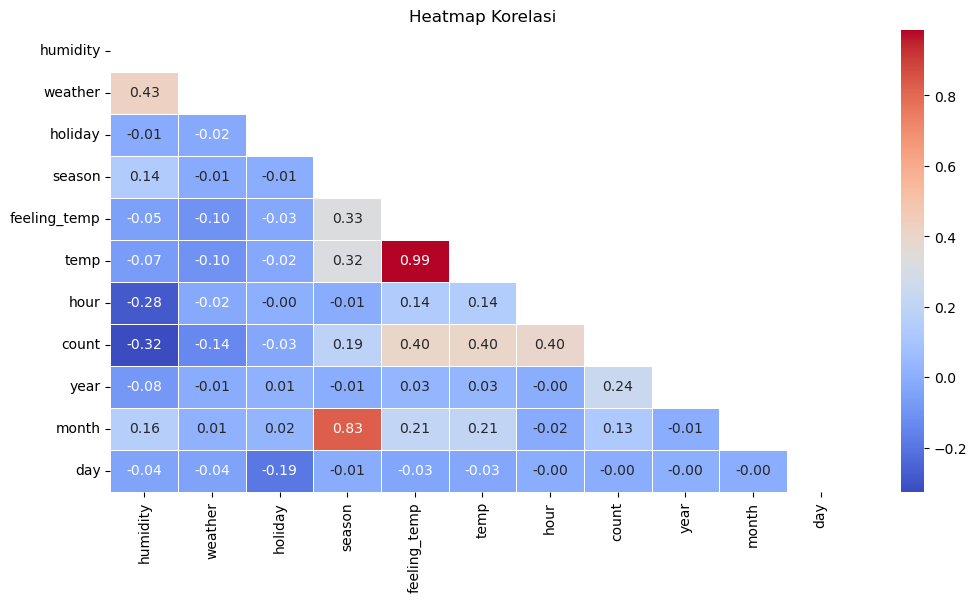

In [23]:
# Hitung korelasi
correlation_matrix = df.corr()
up_triangle = np.triu(df.corr())

# Plot heatmap korelasi
plt.figure(figsize=(12, 6))
sns.heatmap(correlation_matrix, annot=True,mask=up_triangle, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

In [24]:
df1 = df.copy()

In [25]:
# df1 = df1.drop(['feeling_temp',], axis=1)

In [26]:
# df_seen, df_unseen = train_test_split(df, test_size=0.2, random_state=42)
df_seen, df_unseen = train_test_split(df1, test_size=0.2, random_state=42)

In [27]:
print('df_seen shape:',df_seen.shape)
print('df_unseen shape:',df_unseen.shape)

df_seen shape: (9720, 11)
df_unseen shape: (2430, 11)


In [28]:
feature = df_seen.drop('count', axis=1)
target = df_seen['count']

In [29]:
X_train, X_test, y_train, y_test = train_test_split(feature, target, test_size=0.3, random_state=42)

print('feature_train shape:', X_train.shape)
print('target_train shape:', y_train.shape)

feature_train shape: (6804, 10)
target_train shape: (6804,)


In [30]:
X_train.head()

,humidity,weather,holiday,season,feeling_temp,temp,hour,year,month,day
11040,0.75,2,0,4,0.2727,0.28,6,2012,12,4
4483,0.55,1,0,3,0.6970,0.76,2,2011,7,2
4867,0.54,2,0,1,0.4394,0.44,17,2011,3,2
8373,0.60,1,0,3,0.6061,0.60,3,2011,6,3
5714,0.40,1,0,4,0.4091,0.40,16,2011,12,3


In [31]:
X_train.describe()

,humidity,weather,holiday,season,feeling_temp,temp,hour,year,month,day
count,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.00000
mean,0.627732,1.414168,0.031158,2.498530,0.478222,0.499303,11.598178,2011.499853,6.556584,2.97619
std,0.190680,0.637049,0.173758,1.109537,0.172611,0.193174,6.949106,0.500037,3.448945,1.99927
min,0.080000,1.000000,0.000000,1.000000,0.015200,0.020000,0.000000,2011.000000,1.000000,0.00000
25%,0.480000,1.000000,0.000000,2.000000,0.333300,0.340000,6.000000,2011.000000,4.000000,1.00000
50%,0.630000,1.000000,0.000000,3.000000,0.484800,0.500000,12.000000,2011.000000,7.000000,3.00000
75%,0.780000,2.000000,0.000000,3.000000,0.621200,0.660000,18.000000,2012.000000,10.000000,5.00000
max,1.000000,4.000000,1.000000,4.000000,0.984800,0.980000,23.000000,2012.000000,12.000000,6.00000


Fungsi boxcox_transform untuk mengatasi data yang tidak normal.<br>
Fungsi cyclic_transform untuk menangkap pola siklik pada month dan day.

In [32]:
# Custom Transformer untuk Log Transformation dengan get_feature_names_out
class LogTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_transformed = X.copy()
        for col in X.columns:
            X_transformed[col] = np.log(X[col])  # Terapkan logaritma pada fitur
        return X_transformed
    
    def get_feature_names_out(self, input_features=None):
        # Mengembalikan nama fitur yang sama setelah transformasi
        return input_features

In [33]:
# Fungsi Box-Cox 
def boxcox_transform(X):
    X_transformed = X.copy()
    for col in X.columns:
        X_transformed[col], _ = boxcox(X[col])
    return X_transformed

# Fungsi untuk melakukan Log Transformation pada fitur numerik
def log_transform(X):
    X_transformed = X.copy()
    for col in X.columns:
        X_transformed[col] = np.log(X[col])  # Terapkan logaritma pada fitur
    return X_transformed


In [34]:
boxcox_pipeline = Pipeline(steps=[
    ('boxcox', FunctionTransformer(func=boxcox_transform, validate=False)),
])


# Pipeline untuk transformasi Log pada fitur numerik
log_pipeline = Pipeline(steps=[
    ('log_transform', LogTransformer()),
    # ('std', StandardScaler())
])

# Pipeline untuk Fitur Siklik
cyclical_transformer = Pipeline([
    ('cyclical_features', CyclicalFeatures(
        variables=['hour','day', 'month'],  # Fitur siklik
        max_values={'hour': 24,'day':7,'month': 12},
        drop_original=True  # Nilai maksimum untuk setiap fitur siklik
    )),
    # ('std', RobustScaler()) # StandardScaler
])

In [69]:
# transforms = ColumnTransformer(
#     transformers=[
#         ('num', log_pipeline, ['temp', 'feeling_temp', 'humidity']),  # Transformasi Box-Cox
#         ('cyclic', cyclical_transformer, ['hour', 'day', 'month']),  # Transformasi siklik
#         ('ohe', OneHotEncoder(), ['weather','season'])  # Encoding kategorikal
#     ],
#     remainder='passthrough', verbose_feature_names_out=False  # Biarkan fitur lainnya tetap
# )


transforms = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), ['temp','feeling_temp', 'humidity','year']),  # Transformasi Box-Cox
        # ('num', KBinsDiscretizer(n_bins=4, encode='ordinal', strategy='quantile'), ['temp','humidity','feeling_temp']),
        ('cyclic', cyclical_transformer, ['hour','month','day']),  # Transformasi siklik
        ('ohe', OneHotEncoder(), ['season'])  # Encoding kategorikal
    ],
    remainder='passthrough', verbose_feature_names_out=False  # Biarkan fitur lainnya tetap
)


In [70]:
transforms.fit(X_train)

ColumnTransformer(remainder='passthrough',
                  transformers=[('num',
                                 KBinsDiscretizer(encode='ordinal', n_bins=4),
                                 ['temp', 'humidity', 'feeling_temp']),
                                ('cyclic',
                                 Pipeline(steps=[('cyclical_features',
                                                  CyclicalFeatures(drop_original=True,
                                                                   max_values={'day': 7,
                                                                               'hour': 24,
                                                                               'month': 12},
                                                                   variables=['hour',
                                                                              'day',
                                                                              'month']))]),
                                 ['hour', 'month', 'day']),
                                ('ohe', OneHotEncoder(), ['season'])],
                  verbose_feature_names_out=False)

In [71]:
X_train_pre = transforms.transform(X_train)
X_test_pre = transforms.transform(X_test)

In [72]:
# DataFrame
X_train_pre = pd.DataFrame(X_train_pre, columns=transforms.get_feature_names_out())
X_test_pre = pd.DataFrame(X_test_pre, columns=transforms.get_feature_names_out())

In [50]:
X_train_pre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6804 entries, 0 to 6803
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   hour_sin      6804 non-null   float64
 1   hour_cos      6804 non-null   float64
 2   day_sin       6804 non-null   float64
 3   day_cos       6804 non-null   float64
 4   month_sin     6804 non-null   float64
 5   month_cos     6804 non-null   float64
 6   season_1      6804 non-null   float64
 7   season_2      6804 non-null   float64
 8   season_3      6804 non-null   float64
 9   season_4      6804 non-null   float64
 10  year_2011     6804 non-null   float64
 11  year_2012     6804 non-null   float64
 12  humidity      6804 non-null   float64
 13  weather       6804 non-null   float64
 14  holiday       6804 non-null   float64
 15  feeling_temp  6804 non-null   float64
 16  temp          6804 non-null   float64
dtypes: float64(17)
memory usage: 903.8 KB


In [51]:
X_train_pre.describe()

,hour_sin,hour_cos,day_sin,day_cos,month_sin,month_cos,season_1,season_2,season_3,season_4,year_2011,year_2012,humidity,weather,holiday,feeling_temp,temp
count,6804.000000,6.804000e+03,6804.000000,6804.000000,6.804000e+03,6.804000e+03,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000,6804.000000
mean,-0.007408,1.495307e-03,0.003226,0.000799,-1.298030e-02,-1.843087e-03,0.249706,0.242798,0.266755,0.240741,0.500147,0.499853,0.627732,1.414168,0.031158,0.478222,0.499303
std,0.705222,7.090500e-01,0.708045,0.706264,7.050878e-01,7.091024e-01,0.432875,0.428806,0.442296,0.427565,0.500037,0.500037,0.190680,0.637049,0.173758,0.172611,0.193174
min,-1.000000,-1.000000e+00,-0.974928,-0.900969,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.080000,1.000000,0.000000,0.015200,0.020000
25%,-0.707107,-7.071068e-01,-0.781831,-0.900969,-8.660254e-01,-8.660254e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.480000,1.000000,0.000000,0.333300,0.340000
50%,0.000000,-1.836970e-16,0.000000,-0.222521,-2.449294e-16,-1.836970e-16,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.630000,1.000000,0.000000,0.484800,0.500000
75%,0.707107,7.071068e-01,0.781831,0.623490,5.000000e-01,8.660254e-01,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.780000,2.000000,0.000000,0.621200,0.660000
max,1.000000,1.000000e+00,0.974928,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000,0.984800,0.980000


# Model Development

In [41]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

from sklearn.model_selection import GridSearchCV, KFold, cross_validate

from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss

from sklearn.compose import TransformedTargetRegressor

# errors
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, make_scorer, mean_squared_error, r2_score

from sklearn.utils import parallel_backend

In [73]:
# Pipeline
base_reg = Pipeline(steps=[
    ('FeatureEngineering', transforms),
    ('Regression', None)  # Placeholder for model
])

In [43]:
linearReg = LinearRegression()
ridge = Ridge(random_state=42)
lasso = Lasso(random_state=42)
tree = DecisionTreeRegressor(random_state=42)
forest = RandomForestRegressor(random_state=42)
gbr = GradientBoostingRegressor(random_state=42)
xgb = XGBRegressor(random_state=42)
lgbm = LGBMRegressor(random_state=42)

models = [linearReg, ridge, lasso, tree, forest, gbr, xgb, lgbm]

In [44]:
scoring = {
    'rmse': make_scorer(mean_squared_error, greater_is_better=False, squared=False),
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),
    'mape': make_scorer(mean_absolute_percentage_error, greater_is_better=False),
    'R2': make_scorer(r2_score)
}

In [74]:
def mape(y_true, y_pred):
    return mean_absolute_percentage_error(y_true, y_pred)
# Example parameter grid (customize for your models)
param_grid = {
    'Regression': models,
}

# Placeholder for results
results = []


# Perform GridSearchCV for each model in the pipeline
for model in models:
    pipe = Pipeline(steps=[
        ('FeatureEngineering', transforms),
        ('Regression', model)
    ])

    grid_search1 = GridSearchCV(pipe, param_grid={}, scoring=scoring, refit='R2', cv=5, n_jobs=-1)
    grid_search1.fit(X_train, y_train)

    # Collect metrics for the best model
    best_model = grid_search1.best_estimator_
    y_pred = best_model.predict(X_test)

    results.append({
        'Model': type(model).__name__,
        'Best Params': grid_search1.best_params_,
        'RMSE': rmse(y_test, y_pred),
        'MAPE': mape(y_test, y_pred),
        'MAE': mean_absolute_error(y_test, y_pred),
        'R2': r2_score(y_test, y_pred)
    })

# Convert results to DataFrame
results_df4 = pd.DataFrame(results)
results_df4.sort_values(by='R2', ascending=False, inplace=True)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 6804, number of used features: 16
[LightGBM] [Info] Start training from score 189.908730


In [75]:
results_df4

,Model,Best Params,RMSE,MAPE,MAE,R2
7,LGBMRegressor,{},45.314167,0.422996,28.764525,0.937792
6,XGBRegressor,{},47.431313,0.461773,29.260296,0.931843
4,RandomForestRegressor,{},50.893101,0.365279,30.590867,0.921531
3,DecisionTreeRegressor,{},64.774410,0.413754,38.812186,0.872888
5,GradientBoostingRegressor,{},66.736918,1.285029,46.636187,0.865069
1,Ridge,{},127.092088,2.795920,92.346607,0.510652
0,LinearRegression,{},127.094522,2.796849,92.352368,0.510633
2,Lasso,{},127.159319,2.664864,91.781442,0.510134


In [60]:
# results_df3

,Model,Best Params,RMSE,MAPE,MAE,R2
7,LGBMRegressor,{},42.207633,0.452491,26.811519,0.946029
6,XGBRegressor,{},43.560146,0.453409,27.491231,0.942514
4,RandomForestRegressor,{},45.981791,0.362692,28.138917,0.935945
3,DecisionTreeRegressor,{},68.981834,0.444662,41.026920,0.855838
5,GradientBoostingRegressor,{},69.241692,1.387284,48.420551,0.854750
1,Ridge,{},128.123955,2.869650,93.409646,0.502674
0,LinearRegression,{},128.127731,2.870818,93.416314,0.502644
2,Lasso,{},128.294181,2.739220,92.873813,0.501351


In [54]:
# results_df2

,Model,Best Params,RMSE,MAPE,MAE,R2
7,LGBMRegressor,{},42.218689,0.452524,26.816587,0.946000
6,XGBRegressor,{},43.448487,0.453179,27.439832,0.942809
4,RandomForestRegressor,{},45.969994,0.363542,28.139560,0.935978
3,DecisionTreeRegressor,{},67.847045,0.442959,40.570816,0.860542
5,GradientBoostingRegressor,{},69.238939,1.387267,48.417418,0.854762
1,Ridge,{},128.117193,2.867557,93.405511,0.502726
0,LinearRegression,{},128.127731,2.870818,93.416314,0.502644
2,Lasso,{},128.428701,2.778786,93.386409,0.500305


In [232]:
# results_df1

,Model,Best Params,RMSE,MAPE,MAE,R2
7,LGBMRegressor,{},44.155520,0.463612,28.044682,0.940932
6,XGBRegressor,{},46.301942,0.449788,28.730482,0.935050
4,RandomForestRegressor,{},49.437831,0.361236,29.829064,0.925954
5,GradientBoostingRegressor,{},66.456390,1.282416,46.247936,0.866201
3,DecisionTreeRegressor,{},68.069680,0.443912,40.019319,0.859626
1,Ridge,{},127.313351,2.859344,92.867738,0.508947
0,LinearRegression,{},127.316402,2.860128,92.874359,0.508923
2,Lasso,{},127.484209,2.706429,92.132919,0.507628


In [227]:
# results_df

,Model,Best Params,RMSE,MAPE,MAE,R2
7,LGBMRegressor,{},42.085351,0.442379,26.824197,0.946341
6,XGBRegressor,{},44.004763,0.485442,27.843110,0.941335
4,RandomForestRegressor,{},45.970572,0.363887,28.154836,0.935976
3,DecisionTreeRegressor,{},69.584284,0.451905,41.068587,0.853309
5,GradientBoostingRegressor,{},71.674111,1.422604,50.445486,0.844366
1,Ridge,{},127.820328,2.876432,93.349135,0.505028
0,LinearRegression,{},127.831653,2.878805,93.358619,0.504940
2,Lasso,{},128.150539,2.770807,93.250305,0.502467


In [199]:


cv_results = []
for model in models:
    base_reg.set_params(Regression=model)
    with parallel_backend('threading'):  # Untuk paralelitas
        result = cross_validate(
            base_reg,
            X_train,
            y_train,
            cv=5,  # 5-fold cross-validation
            scoring=scoring,
            return_train_score=True
        )
    # Simpan hasil evaluasi
    cv_results.append({
        'Model': model.__class__.__name__,
        'Mean RMSE': -result['test_rmse'].mean(),
        'Std RMSE': result['test_rmse'].std(),
        'Mean MAE': -result['test_mae'].mean(),
        'Std MAE': result['test_mae'].std(),
        'Mean MAPE': -result['test_mape'].mean(),
        'Std MAPE': result['test_mape'].std(),
    })

# Konversi hasil ke DataFrame
results_df = pd.DataFrame(cv_results).sort_values(by='Mean RMSE')
results_df


,Model,Mean RMSE,Std RMSE,Mean MAE,Std MAE,Mean MAPE,Std MAPE
7,LGBMRegressor,45.398213,1.411337,28.699397,0.841577,0.480378,0.009966
6,XGBRegressor,46.494992,1.946516,29.647888,0.595600,0.496040,0.034555
4,RandomForestRegressor,49.064304,1.551500,30.031007,0.644989,0.380930,0.019877
5,GradientBoostingRegressor,69.211147,1.013018,48.369405,0.585576,1.187597,0.110289
3,DecisionTreeRegressor,70.470488,1.715508,40.726726,0.711062,0.445832,0.019631
1,Ridge,128.593325,1.760605,94.218732,0.499412,2.631499,0.197045
0,LinearRegression,128.630538,1.722980,94.272272,0.491324,2.627952,0.188149
2,Lasso,128.970497,1.886553,94.059518,0.606610,2.519553,0.207569


### Without SMOTE

In [200]:
benchmark = GridSearchCV(
    estimator=base_reg,
    param_grid={'Regression': models},
    scoring={
        "rmse": "neg_root_mean_squared_error",
        "mae": "neg_mean_absolute_error",
        "mape": "neg_mean_absolute_percentage_error"
    },
    refit="rmse",
    cv=KFold(n_splits=5, shuffle=True, random_state=42),
    return_train_score=True,
    verbose=1
)

In [201]:
# Benchmark Process
benchmark.fit(X_train, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 292
[LightGBM] [Info] Number of data points in the train set: 5443, number of used features: 19
[LightGBM] [Info] Start training from score 188.152122
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 292
[LightGBM] [Info] Number of data points in the train set: 5443, number of used features: 19
[LightGBM] [Info] Start training from score 189.111887
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('FeatureEngineering',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('cyclic',
                                                                         Pipeline(steps=[('cyclical_features',
                                                                                          CyclicalFeatures(drop_original=True,
                                                                                                           max_values={'day': 7,
                                                                                                                       'hour': 24,
                                                                                                                       'month': 12},
                                                                                                           variables=['hour',
                                                                                                                      'day',
                                                                                                                      'month']))]),
                                                                         ['hour',
                                                                          'month',
                                                                          'day'...
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=42, ...),
                                        LGBMRegressor(random_state=42)]},
             refit='rmse', return_train_score=True,
             scoring={'mae': 'neg_mean_absolute_error',
                      'mape': 'neg_mean_absolute_percentage_error',
                      'rmse': 'neg_root_mean_squared_error'},
             verbose=1)

In [202]:
benchmark.best_score_

np.float64(nan)

In [203]:
pd.DataFrame(benchmark.cv_results_).T

,0,1,2,3,4,5,6,7
mean_fit_time,0.014453,0.010819,0.144379,0.038812,1.823756,0.451205,0.098295,0.076112
std_fit_time,0.003109,0.00076,0.05812,0.000764,0.037111,0.002829,0.023076,0.005349
mean_score_time,0.010864,0.008447,0.009,0.010704,0.030806,0.00982,0.015501,0.0138
std_score_time,0.004735,0.003829,0.004525,0.004688,0.007717,0.002878,0.007535,0.006645
param_Regression,LinearRegression(),Ridge(random_state=42),Lasso(random_state=42),DecisionTreeRegressor(random_state=42),RandomForestRegressor(random_state=42),GradientBoostingRegressor(random_state=42),"XGBRegressor(base_score=None, booster=None, ca...",LGBMRegressor(random_state=42)
params,{'Regression': LinearRegression()},{'Regression': Ridge(random_state=42)},{'Regression': Lasso(random_state=42)},{'Regression': DecisionTreeRegressor(random_st...,{'Regression': RandomForestRegressor(random_st...,{'Regression': GradientBoostingRegressor(rando...,"{'Regression': XGBRegressor(base_score=None, b...",{'Regression': LGBMRegressor(random_state=42)}
split0_test_rmse,-133.827758,-133.724343,-134.174799,-72.923567,-53.309648,-73.260552,-51.313375,-49.127969
split1_test_rmse,-129.628061,-129.654552,-130.527497,-66.545356,-49.472003,-69.331361,-44.18704,-44.992896
split2_test_rmse,-126.54501,-126.547121,-126.567531,-67.09053,-47.47248,-70.227977,-42.711665,-42.418614
split3_test_rmse,-125.533513,-125.557014,-125.803448,-71.81028,-47.928937,-68.457508,-46.066532,-43.948532


In [204]:
# cv_results = benchmark.cv_results_

# results_df = pd.DataFrame({
#     'Model': cv_results['params'],  # Hyperparameter combinations
#     'Mean RMSE': -cv_results['mean_test_neg_root_mean_squared_error'],  # RMSE, negatif karena scoring menggunakan neg_value
#     'Std RMSE': cv_results['std_test_neg_root_mean_squared_error'],
#     'Mean MAPE': -cv_results['mean_test_neg_mean_absolute_percentage_error'],  # MAPE, negatif
#     'Std MAPE': cv_results['std_test_neg_mean_absolute_percentage_error'],
#     'Mean MAE': -cv_results['mean_test_neg_mean_absolute_error'],  # MAE, negatif
#     'Std MAE': cv_results['std_test_neg_mean_absolute_error'],
# })

# results_df['Model'] = results_df['Model'].apply(lambda x: list(x.values())[0].__class__.__name__)
# results_df = results_df.sort_values(by="Mean RMSE")

# results_df

### Transform Log Target

In [205]:
log_linear = TransformedTargetRegressor(LinearRegression(), func=np.log, inverse_func=np.exp)
log_ridge = TransformedTargetRegressor(Ridge(random_state=42), func=np.log, inverse_func=np.exp)
log_lasso = TransformedTargetRegressor(Lasso(random_state=42), func=np.log, inverse_func=np.exp)
log_tree = TransformedTargetRegressor(DecisionTreeRegressor(random_state=42), func=np.log, inverse_func=np.exp)
log_forest = TransformedTargetRegressor(RandomForestRegressor(random_state=42), func=np.log, inverse_func=np.exp)
log_gboost = TransformedTargetRegressor(GradientBoostingRegressor(random_state=42), func=np.log, inverse_func=np.exp)
log_xgb = TransformedTargetRegressor(XGBRegressor(random_state=42, categorical_enable=True), func=np.log, inverse_func=np.exp)
log_lgbm = TransformedTargetRegressor(LGBMRegressor(random_state=42), func=np.log, inverse_func=np.exp)

models_log = [log_linear, log_ridge, log_lasso, log_tree, log_forest, log_gboost, log_xgb, log_lgbm]

In [ ]:
# Define metrics
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mape(y_true, y_pred):
    return mean_absolute_percentage_error(y_true, y_pred)

# Custom scorers
scoring = {
    'RMSE': make_scorer(rmse, greater_is_better=False),
    'MAPE': make_scorer(mape, greater_is_better=False),
    'MAE': make_scorer(mean_absolute_error, greater_is_better=False),
    'R2': make_scorer(r2_score)
}

# Example parameter grid (customize for your models)
param_grid = {
    'Regression': models_log,
}

# Placeholder for results
results = []


# Perform GridSearchCV for each model in the pipeline
for model in models_log:
    pipe = Pipeline(steps=[
        ('FeatureEngineering', transforms),
        ('Regression', model)
    ])

    grid_search = GridSearchCV(pipe, param_grid={}, scoring=scoring, refit='R2', cv=5, n_jobs=-1)
    grid_search.fit(X_train, y_train)

    # Collect metrics for the best model
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    results.append({
        'Model': type(model.regressor).__name__,
        'Best Params': grid_search.best_params_,
        'RMSE': rmse(y_test, y_pred),
        'MAPE': mape(y_test, y_pred),
        'MAE': mean_absolute_error(y_test, y_pred),
        'R2': r2_score(y_test, y_pred)
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)
results_df.sort_values(by='R2', ascending=False, inplace=True)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 294
[LightGBM] [Info] Number of data points in the train set: 6804, number of used features: 19
[LightGBM] [Info] Start training from score 4.545361


In [220]:
results_df

,Model,Best Params,RMSE,MAPE,MAE,R2
7,LGBMRegressor,{},43.805621,0.257664,27.115666,0.941865
6,XGBRegressor,{},44.418781,0.265646,27.266586,0.940226
4,RandomForestRegressor,{},44.791673,0.284744,27.625285,0.939218
3,DecisionTreeRegressor,{},66.707043,0.417199,39.182892,0.865189
5,GradientBoostingRegressor,{},71.162167,0.374615,44.378480,0.846581
0,LinearRegression,{},159.125390,1.059512,101.520974,0.232887
1,Ridge,{},159.141091,1.059767,101.530117,0.232735
2,Lasso,{},204.960609,3.899547,143.748817,-0.272687


In [ ]:
cv_results_log = []
for model in models_log:
    base_reg.set_params(Regression=model)
    with parallel_backend('threading'):  # Untuk paralelitas
        result = cross_validate(
            base_reg,
            X_train,
            y_train,
            cv=5,  # 5-fold cross-validation
            scoring=scoring,
            return_train_score=True
        )
    # Simpan hasil evaluasi
    cv_results_log.append({
        'Model': model.__class__.__name__,
        'Mean RMSE': -result['test_rmse'].mean(),
        'Std RMSE': result['test_rmse'].std(),
        'Mean MAE': -result['test_mae'].mean(),
        'Std MAE': result['test_mae'].std(),
        'Mean MAPE': -result['test_mape'].mean(),
        'Std MAPE': result['test_mape'].std(),
    })

# Konversi hasil ke DataFrame
results_log_df = pd.DataFrame(cv_results_log).sort_values(by='Mean RMSE')
results_log_df

,Model,Mean RMSE,Std RMSE,Mean MAE,Std MAE,Mean MAPE,Std MAPE
7,TransformedTargetRegressor,46.787905,1.604172,28.281148,0.660944,0.266774,0.009748
6,TransformedTargetRegressor,48.615807,0.943464,29.396196,0.333850,0.280818,0.011594
4,TransformedTargetRegressor,50.272829,2.002762,30.389732,0.746013,0.300555,0.008936
3,TransformedTargetRegressor,69.282088,1.516273,40.876805,1.296325,0.449002,0.047984
5,TransformedTargetRegressor,71.745754,3.442931,45.439725,1.959078,0.391088,0.009558
1,TransformedTargetRegressor,152.833619,1.064382,99.016540,2.048599,1.010585,0.043694
0,TransformedTargetRegressor,153.137710,0.716155,99.156617,1.814614,1.010465,0.045556
2,TransformedTargetRegressor,205.572766,4.627725,142.828596,3.273204,3.686070,0.211946


In [207]:
benchmark_log = GridSearchCV(
    estimator=base_reg,
    param_grid={'Regression': models_log},
    scoring={
        "rmse": "neg_root_mean_squared_error",
        "mae": "neg_mean_absolute_error",
        "mape": "neg_mean_absolute_percentage_error"
    },
    refit="rmse",
    cv=KFold(n_splits=5, shuffle=True, random_state=42),
    return_train_score=True,
    verbose=1
)

In [208]:
benchmark_log.fit(X_train, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 292
[LightGBM] [Info] Number of data points in the train set: 5443, number of used features: 19
[LightGBM] [Info] Start training from score 4.531716
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 292
[LightGBM] [Info] Number of data points in the train set: 5443, number of used features: 19
[LightGBM] [Info] Start training from score 4.545927
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you c

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('FeatureEngineering',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('cyclic',
                                                                         Pipeline(steps=[('cyclical_features',
                                                                                          CyclicalFeatures(drop_original=True,
                                                                                                           max_values={'day': 7,
                                                                                                                       'hour': 24,
                                                                                                                       'month': 12},
                                                                                                           variables=['hour',
                                                                                                                      'day',
                                                                                                                      'month']))]),
                                                                         ['hour',
                                                                          'month',
                                                                          'day'...
                                                                                          multi_strategy=None,
                                                                                          n_estimators=None,
                                                                                          n_jobs=None,
                                                                                          num_parallel_tree=None, ...)),
                                        TransformedTargetRegressor(func=<ufunc 'log'>,
                                                                   inverse_func=<ufunc 'exp'>,
                                                                   regressor=LGBMRegressor(random_state=42))]},
             refit='rmse', return_train_score=True,
             scoring={'mae': 'neg_mean_absolute_error',
                      'mape': 'neg_mean_absolute_percentage_error',
                      'rmse': 'neg_root_mean_squared_error'},
             verbose=1)

In [209]:
cv_results = benchmark_log.cv_results_

results_df = pd.DataFrame({
    'Model': [params['Regression'] for params in cv_results['params']],  # Ambil model dari 'Regression'
    'Mean RMSE': -cv_results['mean_test_rmse'],  # RMSE, ubah negatif
    'Std RMSE': cv_results['std_test_rmse'],
    'Mean MAPE': -cv_results['mean_test_mape'],  # MAPE, ubah negatif
    'Std MAPE': cv_results['std_test_mape'],
    'Mean MAE': -cv_results['mean_test_mae'],  # MAE, ubah negatif
    'Std MAE': cv_results['std_test_mae'],
})

# Ubah nama model menjadi nama dari regressor dalam TransformedTargetRegressor
results_df['Model'] = results_df['Model'].apply(
    lambda model: model.regressor.__class__.__name__ if isinstance(model, TransformedTargetRegressor) else model.__class__.__name__
)

# Urutkan berdasarkan Mean RMSE
results_df = results_df.sort_values(by="Mean RMSE").reset_index(drop=True)

# Tampilkan DataFrame
results_df

,Model,Mean RMSE,Std RMSE,Mean MAPE,Std MAPE,Mean MAE,Std MAE
0,LinearRegression,NaN,NaN,NaN,NaN,NaN,NaN
1,Ridge,NaN,NaN,NaN,NaN,NaN,NaN
2,Lasso,NaN,NaN,NaN,NaN,NaN,NaN
3,DecisionTreeRegressor,NaN,NaN,NaN,NaN,NaN,NaN
4,RandomForestRegressor,NaN,NaN,NaN,NaN,NaN,NaN
5,GradientBoostingRegressor,NaN,NaN,NaN,NaN,NaN,NaN
6,XGBRegressor,NaN,NaN,NaN,NaN,NaN,NaN
7,LGBMRegressor,NaN,NaN,NaN,NaN,NaN,NaN


# Prediction

In [210]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
from statsmodels.tools.eval_measures import rmse

In [ ]:
model = Pipeline(steps=[
    ('FeatureEngineering', transforms),
    ('Model', lgbm)
])

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Calculating evaluation metrics
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

# Creating a DataFrame for the scores
score = pd.DataFrame(
    {
        'Metric': ['RMSE', 'MAE', 'MAPE'],
        'Value': [rmse, mae, mape]
    }
)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 294
[LightGBM] [Info] Number of data points in the train set: 6804, number of used features: 19
[LightGBM] [Info] Start training from score 189.908730


In [212]:
score

,Metric,Value
0,RMSE,42.085351
1,MAE,26.824197
2,MAPE,0.442379


In [ ]:
log_xgb = TransformedTargetRegressor(XGBRegressor(random_state=42, categorical_enable=True), func=np.log, inverse_func=np.exp)

model = Pipeline(steps=[
    ('FeatureEngineering', transforms),
    ('Model', log_lgbm)
])

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Calculating evaluation metrics
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

# Creating a DataFrame for the scores
score = pd.DataFrame(
    {
        'Metric': ['RMSE', 'MAE', 'MAPE'],
        'Value': [rmse, mae, mape]
    }
)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 294
[LightGBM] [Info] Number of data points in the train set: 6804, number of used features: 19
[LightGBM] [Info] Start training from score 4.545361


In [214]:
score

,Metric,Value
0,RMSE,43.805621
1,MAE,27.115666
2,MAPE,0.257664


In [215]:
# Definisikan pipeline dengan nama step yang sesuai
log_lgbm = TransformedTargetRegressor(
    regressor=LGBMRegressor(random_state=42), func=np.log, inverse_func=np.exp
)

pipe_model = Pipeline([
    ("preprocessing", transforms),
    ("regressor", log_lgbm)  # Ganti "modeling" dengan "regressor"
])

# Perbarui param_grid sesuai dengan nama step baru
param_grid = {
    'regressor__regressor__learning_rate': [0.01, 0.05, 0.1],
    'regressor__regressor__n_estimators': [100, 200, 500],
    'regressor__regressor__num_leaves': [20, 31, 40],
    'regressor__regressor__max_depth': [5, 10, 15],
    'regressor__regressor__subsample': [0.8, 0.9, 1.0],
    'regressor__regressor__colsample_bytree': [0.8, 0.9, 1.0]
}

# Perbaiki penggunaan GridSearchCV
grid_search = GridSearchCV(
    estimator=pipe_model,
    param_grid=param_grid,
    scoring=["neg_root_mean_squared_error", "neg_mean_absolute_error", "neg_mean_absolute_percentage_error"],
    refit='neg_root_mean_squared_error',
    cv=StratifiedKFold(shuffle=True, random_state=42),
    return_train_score=True,
    verbose=1
)

# Fit model
grid_search.fit(X_train, y_train)


NameError: name 'StratifiedKFold' is not defined

In [63]:
grid_search.best_params_
# print(grid_search.best_score_)

{'regressor__regressor__colsample_bytree': 1.0,
 'regressor__regressor__learning_rate': 0.05,
 'regressor__regressor__max_depth': 10,
 'regressor__regressor__n_estimators': 500,
 'regressor__regressor__num_leaves': 40,
 'regressor__regressor__subsample': 0.8}

In [65]:
grid_search.best_score_

np.float64(-43.62136617677343)

In [98]:
# Model XGBoost
lgbm_model = {"LightGBM_1" : log_lgbm}

# Define model with the best estimator
lgbm_tuning = grid_search.best_estimator_

# Fitting model
lgbm_tuning.fit(X_train, y_train)

# Predict to test data
y_pred_lgbm_tuning = lgbm_tuning.predict(X_test)

# Save the metrics after tunning
rmse_lgbm_tuning = rmse(y_test, y_pred_lgbm_tuning)
mae_lgbm_tuning = mean_absolute_error(y_test, y_pred_lgbm_tuning)
mape_lgbm_tuning = mean_absolute_percentage_error(y_test, y_pred_lgbm_tuning)

score_after_tuning_1 = pd.DataFrame(
    {
    "RMSE": rmse_lgbm_tuning, 
    "MAE": mae_lgbm_tuning, 
    "MAPE": mape_lgbm_tuning
    },
    index=lgbm_model.keys()
)

score_after_tuning_1

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 293
[LightGBM] [Info] Number of data points in the train set: 6804, number of used features: 17
[LightGBM] [Info] Start training from score 4.545361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

TypeError: 'numpy.float64' object is not callable

In [69]:
# Persempit rentang hyperparameter berdasarkan hasil tuning pertama
param_grid_tuning2 = {
    'regressor__regressor__learning_rate': [0.03, 0.05, 0.07],  # Di sekitar 0.05
    'regressor__regressor__n_estimators': [400, 500, 600],      # Di sekitar 500
    'regressor__regressor__num_leaves': [35, 40, 45],           # Di sekitar 40
    'regressor__regressor__max_depth': [8, 10, 12],             # Di sekitar 10
    'regressor__regressor__subsample': [0.7, 0.8, 0.9],         # Di sekitar 0.8
    'regressor__regressor__colsample_bytree': [0.9, 1.0]        # Di sekitar 1.0
}

# Jalankan GridSearchCV dengan param_grid baru
grid_search_tuning2 = GridSearchCV(
    estimator=pipe_model,
    param_grid=param_grid_tuning2,
    scoring=["neg_root_mean_squared_error", "neg_mean_absolute_error", "neg_mean_absolute_percentage_error"],
    refit='neg_root_mean_squared_error',
    cv=StratifiedKFold(shuffle=True, random_state=42),
    return_train_score=True,
    verbose=1
)

# Fit model pada tuning kedua
grid_search_tuning2.fit(X_train, y_train)


Fitting 5 folds for each of 486 candidates, totalling 2430 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 5443, number of used features: 17
[LightGBM] [Info] Start training from score 4.546139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

In [ ]:
# Output hasil terbaik dari tuning kedua
print("Best parameters from tuning 2:", grid_search_tuning2.best_params_)
print("Best score (neg RMSE) from tuning 2:", grid_search_tuning2.best_score_)

In [73]:
grid_search_tuning2.best_params_, grid_search.best_params_

({'regressor__regressor__colsample_bytree': 1.0,
  'regressor__regressor__learning_rate': 0.07,
  'regressor__regressor__max_depth': 12,
  'regressor__regressor__n_estimators': 400,
  'regressor__regressor__num_leaves': 45,
  'regressor__regressor__subsample': 0.7},
 {'regressor__regressor__colsample_bytree': 1.0,
  'regressor__regressor__learning_rate': 0.05,
  'regressor__regressor__max_depth': 10,
  'regressor__regressor__n_estimators': 500,
  'regressor__regressor__num_leaves': 40,
  'regressor__regressor__subsample': 0.8})

In [71]:
grid_search_tuning2.best_score_

np.float64(-43.550962855303304)

In [ ]:
# Model XGBoost
lgbm_model = {"LightGBM_2" : log_lgbm}

# Define model with the best estimator
lgbm_tuning2 = grid_search_tuning2.best_estimator_

# Fitting model
lgbm_tuning2.fit(X_train, y_train)

# Predict to test data
y_pred_lgbm_tuning2 = lgbm_tuning2.predict(X_test)

# Save the metrics after tunning
rmse_lgbm_tuning2 = rmse(y_test, y_pred_lgbm_tuning2)
mae_lgbm_tuning2 = mean_absolute_error(y_test, y_pred_lgbm_tuning2)
mape_lgbm_tuning2 = mean_absolute_percentage_error(y_test, y_pred_lgbm_tuning2)

score_after_tuning_2 = pd.DataFrame(
    {
    "RMSE": rmse_lgbm_tuning2, 
    "MAE": mae_lgbm_tuning2, 
    "MAPE": mape_lgbm_tuning2
    },
    index=lgbm_model.keys()
)

score_after_tuning_2

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 293
[LightGBM] [Info] Number of data points in the train set: 6804, number of used features: 17
[LightGBM] [Info] Start training from score 4.545361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,RMSE,MAE,MAPE
LightGBM_2,40.943148,24.889252,0.248918


In [74]:
# Persempit rentang hyperparameter berdasarkan hasil tuning kedua
param_grid_tuning3 = {
    'regressor__regressor__learning_rate': [0.06, 0.07, 0.08],  # Di sekitar 0.07
    'regressor__regressor__n_estimators': [350, 400, 450],      # Di sekitar 400
    'regressor__regressor__num_leaves': [40, 45, 50],           # Di sekitar 45
    'regressor__regressor__max_depth': [10, 12, 14],            # Di sekitar 12
    'regressor__regressor__subsample': [0.65, 0.7, 0.75],       # Di sekitar 0.7
    'regressor__regressor__colsample_bytree': [0.95, 1.0]       # Di sekitar 1.0
}

# Jalankan GridSearchCV dengan param_grid baru
grid_search_tuning3 = GridSearchCV(
    estimator=pipe_model,
    param_grid=param_grid_tuning3,
    scoring=["neg_root_mean_squared_error", "neg_mean_absolute_error", "neg_mean_absolute_percentage_error"],
    refit='neg_root_mean_squared_error',
    cv=StratifiedKFold(shuffle=True, random_state=42),
    return_train_score=True,
    verbose=1
)

# Fit model pada tuning ketiga
grid_search_tuning3.fit(X_train, y_train)

# Output hasil terbaik dari tuning ketiga
print("Best parameters from tuning 3:", grid_search_tuning3.best_params_)
print("Best score (neg RMSE) from tuning 3:", grid_search_tuning3.best_score_)


Fitting 5 folds for each of 486 candidates, totalling 2430 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 5443, number of used features: 17
[LightGBM] [Info] Start training from score 4.546139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

In [77]:
grid_search_tuning3.best_params_, grid_search_tuning2.best_params_, grid_search.best_params_

({'regressor__regressor__colsample_bytree': 1.0,
  'regressor__regressor__learning_rate': 0.07,
  'regressor__regressor__max_depth': 12,
  'regressor__regressor__n_estimators': 400,
  'regressor__regressor__num_leaves': 45,
  'regressor__regressor__subsample': 0.65},
 {'regressor__regressor__colsample_bytree': 1.0,
  'regressor__regressor__learning_rate': 0.07,
  'regressor__regressor__max_depth': 12,
  'regressor__regressor__n_estimators': 400,
  'regressor__regressor__num_leaves': 45,
  'regressor__regressor__subsample': 0.7},
 {'regressor__regressor__colsample_bytree': 1.0,
  'regressor__regressor__learning_rate': 0.05,
  'regressor__regressor__max_depth': 10,
  'regressor__regressor__n_estimators': 500,
  'regressor__regressor__num_leaves': 40,
  'regressor__regressor__subsample': 0.8})

In [76]:
grid_search_tuning3.best_score_

np.float64(-43.550962855303304)

In [79]:
# Model XGBoost
lgbm_model = {"LightGBM_3" : log_lgbm}

# Define model with the best estimator
lgbm_tuning3 = grid_search_tuning3.best_estimator_

# Fitting model
lgbm_tuning3.fit(X_train, y_train)

# Predict to test data
y_pred_lgbm_tuning3 = lgbm_tuning3.predict(X_test)

# Save the metrics after tunning
rmse_lgbm_tuning3 = rmse(y_test, y_pred_lgbm_tuning3)
mae_lgbm_tuning3 = mean_absolute_error(y_test, y_pred_lgbm_tuning3)
mape_lgbm_tuning3 = mean_absolute_percentage_error(y_test, y_pred_lgbm_tuning3)

score_after_tuning_3 = pd.DataFrame(
    {
    "RMSE": rmse_lgbm_tuning3, 
    "MAE": mae_lgbm_tuning3, 
    "MAPE": mape_lgbm_tuning3
    },
    index=lgbm_model.keys()
)

score_after_tuning_3

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000080 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 293
[LightGBM] [Info] Number of data points in the train set: 6804, number of used features: 17
[LightGBM] [Info] Start training from score 4.545361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,RMSE,MAE,MAPE
LightGBM_3,40.943148,24.889252,0.248918


In [ ]:
hyperparameter = pd.concat([score_after_tuning_1, score_after_tuning_2, score_after_tuning_3],axis=0)


In [99]:
# Konversi y_test menjadi DataFrame (opsional, jika data aktual ada)
y_test_df = pd.DataFrame(y_test, columns=['count'])

# Menambahkan prediksi dari model ke DataFrame
X_test_with_predictions = X_test.copy()  # Membuat salinan X_test untuk menambahkan kolom
X_test_with_predictions['predicted'] = y_pred_lgbm_tuning

# X_test_with_predictions
# Jika ingin menambahkan kolom nilai aktual (opsional)
X_test_with_predictions['actual'] = y_test_df.values

X_test_with_predictions

,humidity,weather,holiday,season,feeling_temp,temp,hour,year,month,day,predicted,actual
1749,0.55,1,0,4,0.4545,0.46,4,2012,9,6,12.070368,10
722,0.74,2,0,3,0.6667,0.70,8,2011,8,3,454.473231,484
5220,0.72,2,0,3,0.5000,0.52,15,2011,9,5,328.486344,354
179,0.30,1,0,2,0.7273,0.84,14,2012,6,6,469.900633,500
2288,0.77,1,0,2,0.4848,0.50,6,2012,5,1,169.288643,165
...,...,...,...,...,...,...,...,...,...,...,...,...
10128,0.86,3,0,1,0.2121,0.18,9,2011,1,4,57.422057,101
12112,0.50,2,0,4,0.3485,0.36,19,2011,10,4,263.153430,204
2519,0.62,1,0,4,0.4091,0.40,6,2012,10,6,15.895049,26
3591,0.78,1,0,2,0.5455,0.58,14,2011,4,5,372.377994,391


In [100]:
# 1. Hitung rata-rata nilai target aktual
mean_actual = X_test_with_predictions['actual'].mean()

# 2. Hitung RMSE
rmse = np.sqrt(((X_test_with_predictions['actual'] - X_test_with_predictions['predicted']) ** 2).mean())

# 3. Hitung MAE
mae = (X_test_with_predictions['actual'] - X_test_with_predictions['predicted']).abs().mean()

# 4. Hitung persentase RMSE dan MAE
rmse_percentage = (rmse / mean_actual) * 100
mae_percentage = (mae / mean_actual) * 100

print(f"Rata-rata target aktual: {mean_actual:.2f}")
print(f"RMSE: {rmse:.2f} ({rmse_percentage:.2f}%)")
print(f"MAE: {mae:.2f} ({mae_percentage:.2f}%)")

Rata-rata target aktual: 189.07
RMSE: 39.89 (21.10%)
MAE: 24.58 (13.00%)


In [88]:
print('Presentase RMSE LightGBM_1',(hyperparameter.iloc[0,0]/df['count'].mean())*100)

Presentase RMSE LightGBM_1 21.055431560092135
